<a href="https://colab.research.google.com/github/debashishnanda/Diabetic-Retinopathy-Detection/blob/master/diabeticRetinopathydetect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# Importing all the necessary files
import os
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import Model
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
from skimage.io import imread
from glob import glob
%matplotlib inline

In [0]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{u'kaggle.json': '{"username":"debashishnanda","key":"1c83f8ae960b66b39b6d8a080975f80e"}'}

In [0]:
!ls -lha kaggle.json
!pip install -q kaggle

-rw-r--r-- 1 root root 70 Sep 15 11:18 kaggle.json


In [0]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [0]:
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

ref                                                       title                                              size  lastUpdated          downloadCount  
--------------------------------------------------------  ------------------------------------------------  -----  -------------------  -------------  
therohk/ireland-historical-news                           The Irish Times - Waxy-Wany News                   47MB  2019-08-24 15:36:54            956  
dgomonov/new-york-city-airbnb-open-data                   New York City Airbnb Open Data                      2MB  2019-08-12 16:24:45          11054  
lakshyaag/india-trade-data                                India - Trade Data                                  1MB  2019-08-16 16:13:58           6375  
bradklassen/pga-tour-20102018-data                        PGA Tour Golf Data                                 94MB  2019-08-30 00:09:59           5325  
r3w0p4/bournemouth-venues                                 Venues in Bournemouth         

In [0]:
!kaggle competitions download -c diabetic-retinopathy-detection

  0% 0.00/69.4k [00:00<?, ?B/s]
100% 69.4k/69.4k [00:00<00:00, 60.4MB/s]
  0% 0.00/81.6k [00:00<?, ?B/s]
100% 81.6k/81.6k [00:00<00:00, 73.6MB/s]
 48% 5.00M/10.4M [00:00<00:00, 16.8MB/s]
100% 10.4M/10.4M [00:00<00:00, 29.9MB/s]
100% 7.81G/7.81G [02:40<00:00, 69.1MB/s]
100% 7.81G/7.81G [02:40<00:00, 52.3MB/s]
100% 7.81G/7.81G [02:38<00:00, 34.7MB/s]
100% 7.81G/7.81G [02:38<00:00, 52.8MB/s]
100% 7.81G/7.81G [02:38<00:00, 44.2MB/s]
100% 7.81G/7.81G [02:38<00:00, 52.9MB/s]
100% 1.33G/1.34G [00:28<00:00, 49.3MB/s]
100% 1.34G/1.34G [00:28<00:00, 50.4MB/s]
100% 7.81G/7.81G [02:38<00:00, 58.5MB/s]
100% 7.81G/7.81G [02:38<00:00, 52.8MB/s]
100% 7.80G/7.81G [02:33<00:00, 35.1MB/s]
100% 7.81G/7.81G [02:33<00:00, 54.8MB/s]
100% 7.81G/7.81G [02:30<00:00, 58.4MB/s]
100% 7.81G/7.81G [02:30<00:00, 55.6MB/s]
100% 7.81G/7.81G [02:33<00:00, 45.4MB/s]
100% 7.81G/7.81G [02:33<00:00, 54.7MB/s]
100% 7.81G/7.81G [02:35<00:00, 29.1MB/s]
100% 7.81G/7.81G [02:35<00:00, 54.1MB/s]
100% 7.80G/7.81G [02:35<00:00, 34.

In [0]:
!unzip trainLabels.csv.zip -d content
!unzip sampleSubmission.csv.zip -d content
!unzip sample.zip -d content

Archive:  trainLabels.csv.zip
  inflating: content/trainLabels.csv  
Archive:  sampleSubmission.csv.zip
  inflating: content/sampleSubmission.csv  
Archive:  sample.zip
   creating: content/sample/
  inflating: content/sample/10_left.jpeg  
  inflating: content/sample/10_right.jpeg  
  inflating: content/sample/13_left.jpeg  
  inflating: content/sample/13_right.jpeg  
  inflating: content/sample/15_left.jpeg  
  inflating: content/sample/15_right.jpeg  
  inflating: content/sample/16_left.jpeg  
  inflating: content/sample/16_right.jpeg  
  inflating: content/sample/17_left.jpeg  
  inflating: content/sample/17_right.jpeg  


In [0]:
cat train.zip.* > train.zip

In [0]:
!unzip train.zip -d content

Archive:  train.zip
   creating: content/train/
  inflating: content/train/10003_left.jpeg  
  inflating: content/train/10003_right.jpeg  
  inflating: content/train/10007_left.jpeg  
  inflating: content/train/10007_right.jpeg  
  inflating: content/train/10009_left.jpeg  
  inflating: content/train/10009_right.jpeg  
  inflating: content/train/1000_left.jpeg  
  inflating: content/train/1000_right.jpeg  
  inflating: content/train/10010_left.jpeg  
  inflating: content/train/10010_right.jpeg  
  inflating: content/train/10013_left.jpeg  
  inflating: content/train/10013_right.jpeg  
  inflating: content/train/10014_left.jpeg  
  inflating: content/train/10014_right.jpeg  
  inflating: content/train/10015_left.jpeg  
  inflating: content/train/10015_right.jpeg  
  inflating: content/train/10017_left.jpeg  
  inflating: content/train/10017_right.jpeg  
  inflating: content/train/10022_left.jpeg  
  inflating: content/train/10022_right.jpeg  
  inflating: content/train/10028_left.jpeg  

In [0]:
cat test.zip.* > test.zip

In [0]:
!unzip test.zip -d content

Archive:  test.zip
   creating: content/test/
  inflating: content/test/10000_left.jpeg  
  inflating: content/test/10000_right.jpeg  
  inflating: content/test/10001_left.jpeg  
  inflating: content/test/10001_right.jpeg  
  inflating: content/test/10002_left.jpeg  
  inflating: content/test/10002_right.jpeg  
  inflating: content/test/10004_left.jpeg  
  inflating: content/test/10004_right.jpeg  
  inflating: content/test/10005_left.jpeg  
  inflating: content/test/10005_right.jpeg  
  inflating: content/test/10006_left.jpeg  
  inflating: content/test/10006_right.jpeg  
  inflating: content/test/10008_left.jpeg  
  inflating: content/test/10008_right.jpeg  
  inflating: content/test/10011_left.jpeg  
  inflating: content/test/10011_right.jpeg  
  inflating: content/test/10012_left.jpeg  
  inflating: content/test/10012_right.jpeg  
  inflating: content/test/10016_left.jpeg  
  inflating: content/test/10016_right.jpeg  
  inflating: content/test/10018_left.jpeg  
  inflating: content

In [0]:
base_image_dir = os.path.join('content')
base_image_dir2 = os.path.join('content','train')
retina_df = pd.read_csv(os.path.join(base_image_dir, 'trainLabels.csv'))
retina_df['PatientId'] = retina_df['image'].map(lambda x: x.split('_')[0])
retina_df['path'] = retina_df['image'].map(lambda x: os.path.join(base_image_dir2,
                                                         '{}.jpeg'.format(x)))
retina_df['exists'] = retina_df['path'].map(os.path.exists)
print(retina_df['exists'].sum(), 'images found of', retina_df.shape[0], 'total')
retina_df['eye'] = retina_df['image'].map(lambda x: 1 if x.split('_')[-1]=='left' else 0)
from keras.utils.np_utils import to_categorical
retina_df['Severity_Index'] = retina_df['level'].map(lambda x: to_categorical(x, 1+retina_df['level'].max()))

retina_df.dropna(inplace = True)
retina_df = retina_df[retina_df['exists']]
retina_df.sample(3)

(35126, 'images found of', 35126, 'total')


Using TensorFlow backend.


,image,level,PatientId,path,exists,eye,Severity_Index
10159,12793_right,0,12793,content/train/12793_right.jpeg,True,0,"[1.0, 0.0, 0.0, 0.0, 0.0]"
34556,43683_left,2,43683,content/train/43683_left.jpeg,True,1,"[0.0, 0.0, 1.0, 0.0, 0.0]"
20131,25396_right,0,25396,content/train/25396_right.jpeg,True,0,"[1.0, 0.0, 0.0, 0.0, 0.0]"


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f320fb4fb90>,
      dtype=object)

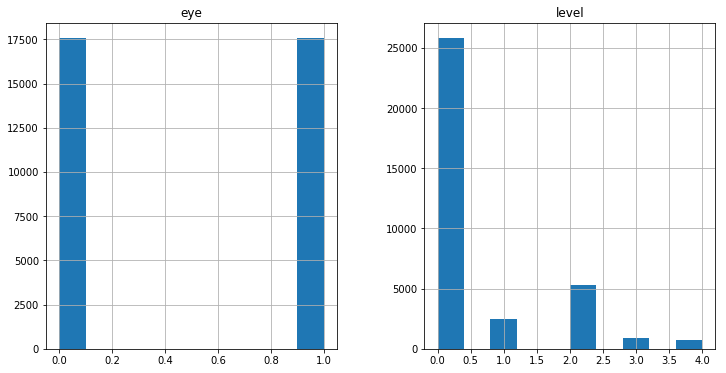

In [0]:
retina_df[['level', 'eye']].hist(figsize = (12, 6))

In [0]:
# Distributing the given dataSet to Training and Validation datasets in the ratio of 3:1 that is 75% training and 25% validation
from sklearn.model_selection import train_test_split
rr_df = retina_df[['PatientId', 'level']].drop_duplicates()
train_ids, valid_ids = train_test_split(rr_df['PatientId'], 
                                   test_size = 0.25, 
                                   random_state = 2018,
                                   stratify = rr_df['level'])
raw_train_df = retina_df[retina_df['PatientId'].isin(train_ids)]
valid_df = retina_df[retina_df['PatientId'].isin(valid_ids)]
print('train', raw_train_df.shape[0], 'validation', valid_df.shape[0])

('train', 27176, 'validation', 9632)


('New Data Size:', 750, 'Old Size:', 27176)


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f320b31ba50>,
      dtype=object)

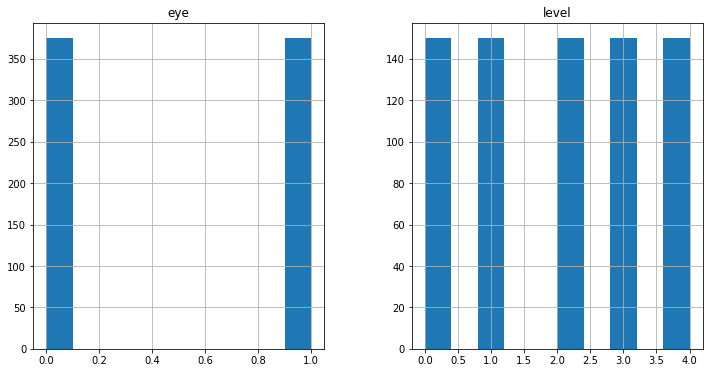

In [0]:
# balancing the above bifurcation
train_df = raw_train_df.groupby(['level', 'eye']).apply(lambda x: x.sample(75, replace = True)).reset_index(drop = True)
print('New Data Size:', train_df.shape[0], 'Old Size:', raw_train_df.shape[0])
train_df[['level', 'eye']].hist(figsize = (12,6))

We preprocess the images to a rescaled size of (512,512), which is somewhat less than the size we usually feed to VGG16 model.
This code was referred from https://becominghuman.ai/data-augmentation-on-gpu-in-tensorflow-13d14ecf2b19

In [0]:
from keras import backend as K
from keras.applications.inception_v3 import preprocess_input
import numpy as np
IMG_SIZE = (512, 512) # slightly smaller than vgg16 expectation
def tf_image_loader(out_size, 
                      horizontal_flip = True, 
                      vertical_flip = False, 
                      random_brightness = True,
                      random_contrast = True,
                      random_saturation = True,
                      random_hue = True,
                      color_mode = 'rgb',
                      preproc_func = preprocess_input,
                      on_batch = False):
    def _func(X):
        with tf.name_scope('image_augmentation'):
            with tf.name_scope('input'):
                X = tf.image.decode_png(tf.read_file(X), channels = 3 if color_mode == 'rgb' else 0)
                X = tf.image.resize_images(X, out_size)
            with tf.name_scope('augmentation'):
                if horizontal_flip:
                    X = tf.image.random_flip_left_right(X)
                if vertical_flip:
                    X = tf.image.random_flip_up_down(X)
                if random_brightness:
                    X = tf.image.random_brightness(X, max_delta = 0.1)
                if random_saturation:
                    X = tf.image.random_saturation(X, lower = 0.75, upper = 1.5)
                if random_hue:
                    X = tf.image.random_hue(X, max_delta = 0.15)
                if random_contrast:
                    X = tf.image.random_contrast(X, lower = 0.75, upper = 1.5)
                return preproc_func(X)
    if on_batch: 
        # we are meant to use it on a batch
        def _batch_func(X, y):
            return tf.map_fn(_func, X), y
        return _batch_func
    else:
        # we apply it to everything
        def _all_func(X, y):
            return _func(X), y         
        return _all_func
    
def tf_augmentor(out_size,
                  intermediate_size = (640, 640),
                  intermediate_trans = 'crop',
                  batch_size = 16,
                  horizontal_flip = True, 
                  vertical_flip = False, 
                  random_brightness = True,
                  random_contrast = True,
                  random_saturation = True,
                  random_hue = True,
                  color_mode = 'rgb',
                  preproc_func = preprocess_input,
                  min_crop_percent = 0.001,
                  max_crop_percent = 0.005,
                  crop_probability = 0.5,
                  rotation_range = 10):
    
    load_ops = tf_image_loader(out_size = intermediate_size, 
                               horizontal_flip=horizontal_flip, 
                               vertical_flip=vertical_flip, 
                               random_brightness = random_brightness,
                               random_contrast = random_contrast,
                               random_saturation = random_saturation,
                               random_hue = random_hue,
                               color_mode = color_mode,
                               preproc_func = preproc_func,
                               on_batch=False)
    def batch_ops(X, y):
        batch_size = tf.shape(X)[0]
        with tf.name_scope('transformation'):
            
            transforms = []
            identity = tf.constant([1, 0, 0, 0, 1, 0, 0, 0], dtype=tf.float32)
            if rotation_range > 0:
                angle_rad = rotation_range / 180 * np.pi
                angles = tf.random_uniform([batch_size], -angle_rad, angle_rad)
                transforms += [tf.contrib.image.angles_to_projective_transforms(angles, intermediate_size[0], intermediate_size[1])]

            if crop_probability > 0:
                crop_pct = tf.random_uniform([batch_size], min_crop_percent, max_crop_percent)
                left = tf.random_uniform([batch_size], 0, intermediate_size[0] * (1.0 - crop_pct))
                top = tf.random_uniform([batch_size], 0, intermediate_size[1] * (1.0 - crop_pct))
                crop_transform = tf.stack([
                      crop_pct,
                      tf.zeros([batch_size]), top,
                      tf.zeros([batch_size]), crop_pct, left,
                      tf.zeros([batch_size]),
                      tf.zeros([batch_size])
                  ], 1)
                coin = tf.less(tf.random_uniform([batch_size], 0, 1.0), crop_probability)
                transforms += [tf.where(coin, crop_transform, tf.tile(tf.expand_dims(identity, 0), [batch_size, 1]))]
            if len(transforms)>0:
                X = tf.contrib.image.transform(X,
                      tf.contrib.image.compose_transforms(*transforms),
                      interpolation='BILINEAR') # or 'NEAREST'
            if intermediate_trans=='scale':
                X = tf.image.resize_images(X, out_size)
            elif intermediate_trans=='crop':
                X = tf.image.resize_image_with_crop_or_pad(X, out_size[0], out_size[1])
            else:
                raise ValueError('Invalid Operation {}'.format(intermediate_trans))
            return X, y
    def _create_pipeline(in_ds):
        batch_ds = in_ds.map(load_ops, num_parallel_calls=4).batch(batch_size)
        return batch_ds.map(batch_ops)
    return _create_pipeline


In [0]:
def flow_from_dataframe(idg, 
                        in_df, 
                        path_col,
                        y_col, 
                        shuffle = True, 
                        color_mode = 'rgb'):
    files_ds = tf.data.Dataset.from_tensor_slices((in_df[path_col].values, 
                                                   np.stack(in_df[y_col].values,0)))
    in_len = in_df[path_col].values.shape[0]
    while True:
        if shuffle:
            files_ds = files_ds.shuffle(in_len) # shuffle the whole dataset
        
        next_batch = idg(files_ds).repeat().make_one_shot_iterator().get_next()
        for i in range(max(in_len//32,1)):
            yield K.get_session().run(next_batch)

In [0]:
batch_size = 48
core_idg = tf_augmentor(out_size = IMG_SIZE, 
                        color_mode = 'rgb', 
                        vertical_flip = True,
                        crop_probability=0.0, # crop doesn't work yet
                        batch_size = batch_size) 
valid_idg = tf_augmentor(out_size = IMG_SIZE, color_mode = 'rgb', 
                         crop_probability=0.0, 
                         horizontal_flip = False, 
                         vertical_flip = False, 
                         random_brightness = False,
                         random_contrast = False,
                         random_saturation = False,
                         random_hue = False,
                         rotation_range = 0,
                        batch_size = batch_size)

train_gen = flow_from_dataframe(core_idg, train_df, 
                             path_col = 'path',
                            y_col = 'Severity_Index')

valid_gen = flow_from_dataframe(valid_idg, valid_df, 
                             path_col = 'path',
                            y_col = 'Severity_Index') #ideal size for evaluation

Images upon which augmentation was'nt carried out.

W0915 12:55:39.278171 139854623508352 deprecation.py:323] From <ipython-input-17-b67ca594c81e>:14: make_one_shot_iterator (from tensorflow.python.data.ops.dataset_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_one_shot_iterator(dataset)`.
W0915 12:55:39.313952 139854623508352 deprecation_wrapper.py:119] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0915 12:55:39.314934 139854623508352 deprecation_wrapper.py:119] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

W0915 12:55:39.316118 139854623508352 

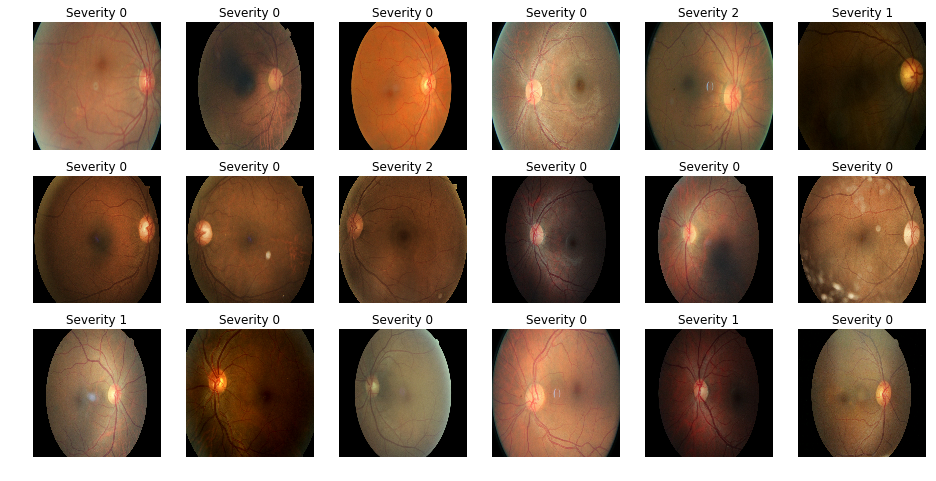

In [0]:
t_x, t_y = next(valid_gen)
fig, m_axs = plt.subplots(3, 6, figsize = (16, 8))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(np.clip(c_x*127+127, 0, 255).astype(np.uint8))
    c_ax.set_title('Severity {}'.format(np.argmax(c_y, -1)))
    c_ax.axis('off')

Whereas the augmented ones look like given below:

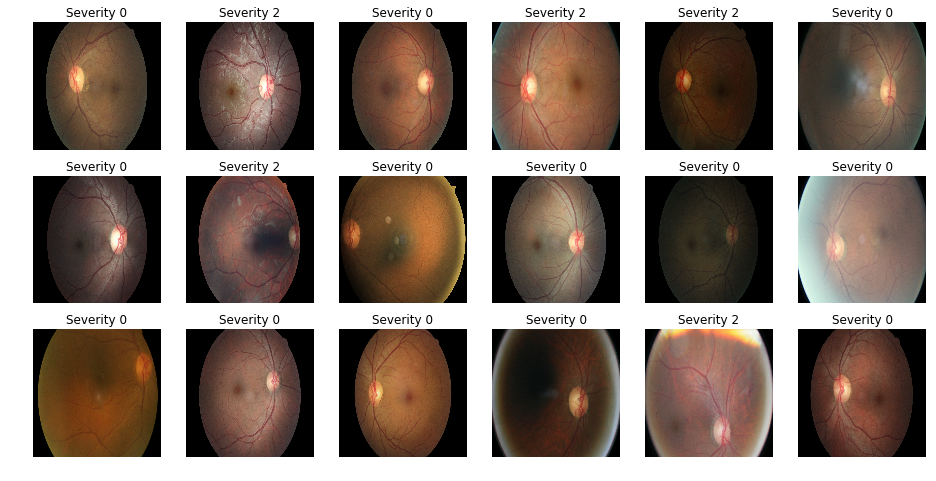

In [0]:
t_x, t_y = next(valid_gen)
fig, m_axs = plt.subplots(3, 6, figsize = (16, 8))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(np.clip(c_x*127+127, 0, 255).astype(np.uint8))
    c_ax.set_title('Severity {}'.format(np.argmax(c_y, -1)))
    c_ax.axis('off')

The model is being downloaded from https://github.com/fchollet/deep-learning-models/releases/download/v0.5/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5



In [0]:
from keras.applications.vgg16 import VGG16 as NandaNET
from keras.applications.inception_resnet_v2 import InceptionResNetV2 as NandaNET
from keras.applications.inception_v3 import InceptionV3 as NandaNET
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten, Input, Conv2D, multiply, LocallyConnected2D, Lambda
from keras.models import Model
from keras import optimizers

in_lay = Input(t_x.shape[1:])
base_pretrained_model = NandaNET(input_shape =  t_x.shape[1:], include_top = False, weights = 'imagenet')
base_pretrained_model.trainable = False
pt_depth = base_pretrained_model.get_output_shape_at(0)[-1]
pt_features = base_pretrained_model(in_lay)
from keras.layers import BatchNormalization
bn_features = BatchNormalization()(pt_features)

# here we do an attention mechanism to turn pixels in the GAP on an off

attn_layer = Conv2D(64, kernel_size = (1,1), padding = 'same', activation = 'relu')(Dropout(0.5)(bn_features))
attn_layer = Conv2D(16, kernel_size = (1,1), padding = 'same', activation = 'relu')(attn_layer)
attn_layer = Conv2D(8, kernel_size = (1,1), padding = 'same', activation = 'relu')(attn_layer)
attn_layer = Conv2D(1, 
                    kernel_size = (1,1), 
                    padding = 'valid', 
                    activation = 'sigmoid')(attn_layer)

# fan it out to all of the channels

up_c2_w = np.ones((1, 1, 1, pt_depth))
up_c2 = Conv2D(pt_depth, kernel_size = (1,1), padding = 'same', 
               activation = 'linear', use_bias = False, weights = [up_c2_w])
up_c2.trainable = False
attn_layer = up_c2(attn_layer)

mask_features = multiply([attn_layer, bn_features])
gap_features = GlobalAveragePooling2D()(mask_features)
gap_mask = GlobalAveragePooling2D()(attn_layer)

# to account for missing values from the attention model

gap = Lambda(lambda x: x[0]/x[1], name = 'RescaleGAP')([gap_features, gap_mask])
gap_dr = Dropout(0.25)(gap)
dr_steps = Dropout(0.25)(Dense(128, activation = 'relu')(gap_dr))
out_layer = Dense(t_y.shape[-1], activation = 'softmax')(dr_steps)
retina_model = Model(inputs = [in_lay], outputs = [out_layer])
from keras.metrics import top_k_categorical_accuracy
def top_2_accuracy(in_gt, in_pred):
    return top_k_categorical_accuracy(in_gt, in_pred, k=2)

RMSprop = optimizers.RMSprop(lr=0.001, rho=0.9, epsilon=None, decay=0.0)
retina_model.compile(optimizer = 'RMSprop', loss = 'categorical_crossentropy',
                           metrics = ['categorical_accuracy', top_2_accuracy])
retina_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
inception_v3 (Model)            (None, 14, 14, 2048) 21802784    input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_285 (BatchN (None, 14, 14, 2048) 8192        inception_v3[1][0]               
__________________________________________________________________________________________________
dropout_7 (Dropout)             (None, 14, 14, 2048) 0           batch_normalization_285[0][0]    
__________________________________________________________________________________________________
conv2d_293

In [0]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}_weights.best.hdf5".format('retina')

checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1, 
                             save_best_only=True, mode='min', save_weights_only = True)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.8, patience=3, verbose=1, mode='auto', epsilon=0.0001, cooldown=5, min_lr=0.0001)
early = EarlyStopping(monitor="val_loss", 
                      mode="min", 
                      patience=6) # probably needs to be more patient
callbacks_list = [checkpoint, early, reduceLROnPlat]

/usr/local/lib/python2.7/dist-packages/keras/callbacks.py:1065: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


In [0]:
!rm -rf ~/.keras # clean up before starting training

In [0]:
retina_model.fit_generator(train_gen, 
                           steps_per_epoch = train_df.shape[0]//batch_size,
                           validation_data = valid_gen, 
                           validation_steps = valid_df.shape[0]//batch_size,
                              epochs = 25, 
                              callbacks = callbacks_list,
                             workers = 0, # tf-generators are not thread-safe
                             use_multiprocessing=False, 
                             max_queue_size = 0
                            )

W0915 13:12:16.494848 139854623508352 deprecation.py:323] From /usr/local/lib/python2.7/dist-packages/tensorflow/python/ops/math_grad.py:1250: where (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/25


W0915 13:12:18.110639 139854623508352 lazy_loader.py:50] 
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



In [0]:
import matplotlib.pyplot as plt
acc = retina_model.history['categorical_accuracy']
val_acc = retina_model.history['val_categorical_accuracy']
loss = retina_model.history['loss']
val_loss = retina_model.history['val_loss']

epochs = range(len(categorical_accuracy))

plt.plot(epochs, acc, 'g', label='Training accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

In [0]:
from google.colab import files
files.upload()

In [0]:
# load the best version of the model
base_model = load_model("../input/weights/h5 files/H5 Files/full_retina_model.h5", custom_objects={'top_2_accuracy': top_2_accuracy})
retina_model.load_weights(weight_path)
retina_model.save('full_retina_model.h5')

In [0]:
# created one fixed dataset for evaluating
from tqdm import tqdm_notebook
# fresh valid gen
valid_gen = flow_from_dataframe(valid_idg, valid_df, 
                             path_col = 'path',
                            y_col = 'level_cat') 
vbatch_count = (valid_df.shape[0]//batch_size-1)
out_size = vbatch_count*batch_size
test_X = np.zeros((out_size,)+t_x.shape[1:], dtype = np.float32)
test_Y = np.zeros((out_size,)+t_y.shape[1:], dtype = np.float32)
for i, (c_x, c_y) in zip(tqdm_notebook(range(vbatch_count)), 
                         valid_gen):
    j = i*batch_size
    test_X[j:(j+c_x.shape[0])] = c_x
    test_Y[j:(j+c_x.shape[0])] = c_y


In [0]:
# get the attention layer since it is the only one with a single output dimension
for attn_layer in retina_model.layers:
    c_shape = attn_layer.get_output_shape_at(0)
    if len(c_shape)==4:
        if c_shape[-1]==1:
            print(attn_layer)
            break

In [0]:
import keras.backend as K
rand_idx = np.random.choice(range(len(test_X)), size = 6)
attn_func = K.function(inputs = [retina_model.get_input_at(0), K.learning_phase()],
           outputs = [attn_layer.get_output_at(0)]
          )
fig, m_axs = plt.subplots(len(rand_idx), 2, figsize = (8, 4*len(rand_idx)))
[c_ax.axis('off') for c_ax in m_axs.flatten()]
for c_idx, (img_ax, attn_ax) in zip(rand_idx, m_axs):
    cur_img = test_X[c_idx:(c_idx+1)]
    attn_img = attn_func([cur_img, 0])[0]
    img_ax.imshow(np.clip(cur_img[0,:,:,:]*127+127, 0, 255).astype(np.uint8))
    attn_ax.imshow(attn_img[0, :, :, 0]/attn_img[0, :, :, 0].max(), cmap = 'viridis', 
                   vmin = 0, vmax = 1, 
                   interpolation = 'lanczos')
    real_cat = np.argmax(test_Y[c_idx, :])
    img_ax.set_title('Eye Image\nCat:%2d' % (real_cat))
    pred_cat = retina_model.predict(cur_img)
    attn_ax.set_title('Attention Map\nPred:%2.2f%%' % (100*pred_cat[0,real_cat]))
fig.savefig('attention_map.png', dpi = 300)

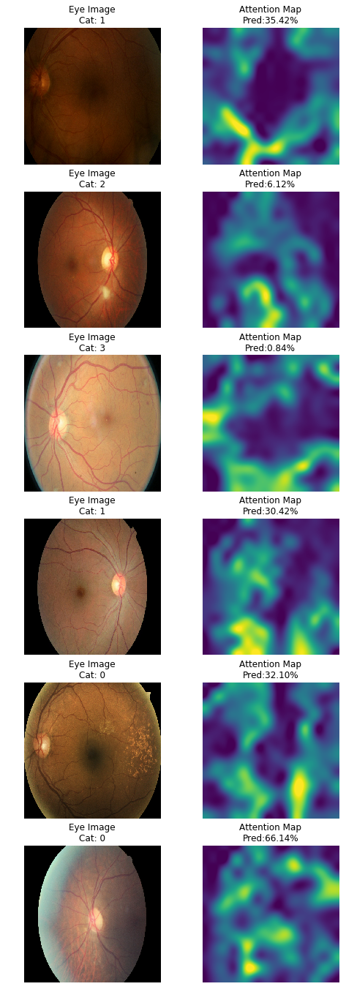

The Precision, Recall and the Accuracy of the above trained model can be evaluated as:

In [0]:
from sklearn.metrics import accuracy_score, classification_report
pred_Y = retina_model.predict(test_X, batch_size = 32, verbose = True)
pred_Y_cat = np.argmax(pred_Y, -1)
test_Y_cat = np.argmax(test_Y, -1)
print('Accuracy on Test Data: %2.2f%%' % (accuracy_score(test_Y_cat, pred_Y_cat)))
print(classification_report(test_Y_cat, pred_Y_cat))

In [0]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
sns.heatmap(confusion_matrix(test_Y_cat, pred_Y_cat), 
            annot=True, fmt="d", cbar = False, cmap = plt.cm.Blues, vmax = test_X.shape[0]//16)

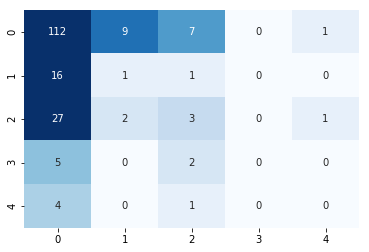

In [0]:
fig, m_axs = plt.subplots(2, 4, figsize = (32, 20))
for (idx, c_ax) in enumerate(m_axs.flatten()):
    c_ax.imshow(np.clip(test_X[idx]*127+127,0 , 255).astype(np.uint8), cmap = 'bone')
    c_ax.set_title('Actual Severity: {}\n{}'.format(test_Y_cat[idx], 
                                                           '\n'.join(['Predicted %02d (%04.1f%%): %s' % (k, 100*v, '*'*int(10*v)) for k, v in sorted(enumerate(pred_Y[idx]), key = lambda x: -1*x[1])])), loc='left')
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png', dpi = 300)

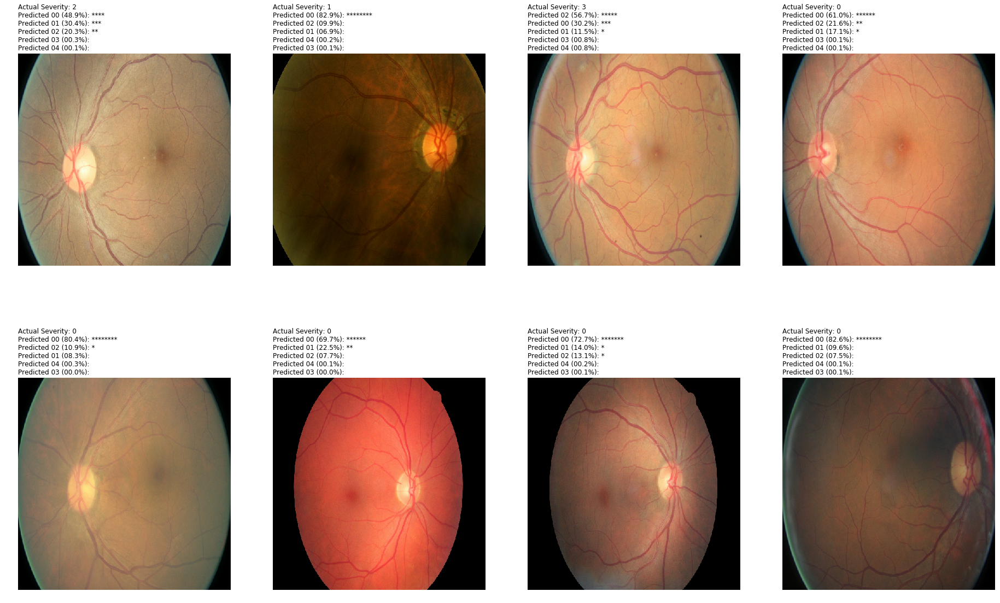